<a href="https://colab.research.google.com/github/mersalas/ecosa/blob/main/ecoli.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# Install packages
!pip install pyforest
!pip install pca

  Preparing metadata (setup.py) ... done
  Created wheel for pyforest: filename=pyforest-1.1.0-py2.py3-none-any.whl size=14605 sha256=cccf93c32d04d56e6bba3e4b93c2e6dfeb032f2c218bdb7ab0edb9e01d5aa593
  Stored in directory: /root/.cache/pip/wheels/9e/7d/2c/5d2f5e62de376c386fd3bf5a8e5bd119ace6a9f48f49df6017
Successfully built pyforest
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 547.9/547.9 kB 4.3 MB/s eta 0:00:00


In [2]:
# Import necessary libraries
from pyforest import*
lazy_imports() # load most libraries
from pca import pca
from sklearn.utils import class_weight
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.ensemble import VotingClassifier, StackingClassifier
from sklearn.model_selection import cross_val_predict
from sklearn.metrics import precision_score, recall_score, accuracy_score, f1_score, roc_auc_score, matthews_corrcoef, cohen_kappa_score, classification_report # evaluation
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, roc_curve, precision_recall_curve # plots

Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)


In [3]:
# Load dataset
url = 'https://raw.githubusercontent.com/mersalas/ecosa/main/dataset/Ecoli_eng.csv'
data = pd.read_csv(url)
X = data.loc[:, ~data.columns.isin(['id', 'smiles', 'Ecoli'])]
y = data.iloc[:, 2].values
cols = data.columns
print(X.shape)
X.head()

<IPython.core.display.Javascript object>

(2268, 2048)


,ECFP0,ECFP1,ECFP2,ECFP3,ECFP4,ECFP5,ECFP6,ECFP7,ECFP8,ECFP9,...,ECFP2038,ECFP2039,ECFP2040,ECFP2041,ECFP2042,ECFP2043,ECFP2044,ECFP2045,ECFP2046,ECFP2047
0,0,1,0,0,0,1,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
1,0,1,0,0,0,0,0,0,0,0,...,0,0,0,1,1,0,0,0,0,0
2,0,1,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,1,1,0,0
3,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0


In [4]:
# Check missing or null values
print(f'There are {pd.concat([data], axis=1).isnull().sum().sum()} missing values \n')

# Count target
print(f'Count of non-AEP: {data["Ecoli"].value_counts()[0]}')
print(f'Count of AEP: {data["Ecoli"].value_counts()[1]}')

<IPython.core.display.Javascript object>

There are 0 missing values 

Count of non-AEP: 913
Count of AEP: 1355


**PCA**

In [5]:
# Initialize pca
model=pca(n_components=0.95, normalize=True)

# Fit transform
results = model.fit_transform(X)

[pca] >Extracting column labels from dataframe.
[pca] >Extracting row labels from dataframe.
[pca] >Normalizing input data per feature (zero mean and unit variance)..
[pca] >The PCA reduction is performed to capture [95.0%] explained variance using the [2048] columns of the input data.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Compute explained variance.
[pca] >Number of components is [779] that covers the [95.00%] explained variance.
[pca] >The PCA reduction is performed on the [2048] columns of the input dataframe.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[779]
[pca] >Multiple test correction applied for Hotelling T2 test: [fdr_bh]
[pca] >Outlier detection using SPE/DmodX with n_std=[3]


<IPython.core.display.Javascript object>

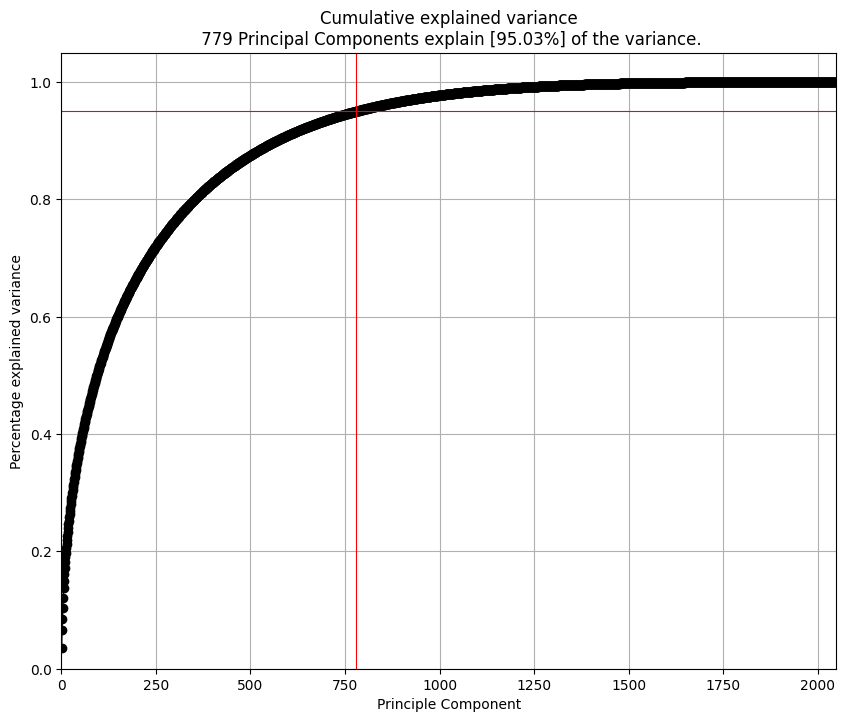

In [6]:
# Screen plot
model.plot(figsize=(10,8))
plt.show()

In [7]:
# Print top features
pd.set_option('display.max_rows', model.results['topfeat'].shape[0]+1)
top = model.results['topfeat']
best = top.loc[top['type']=='best']
best

<IPython.core.display.Javascript object>

,PC,feature,loading,type
0,PC1,ECFP1034,0.094837,best
1,PC2,ECFP680,-0.077032,best
2,PC3,ECFP1123,0.104535,best
3,PC4,ECFP714,0.111075,best
4,PC5,ECFP1910,0.083125,best
5,PC6,ECFP1418,0.076939,best
6,PC7,ECFP582,0.091459,best
7,PC8,ECFP1958,0.094124,best
8,PC9,ECFP1937,0.081419,best
9,PC10,ECFP1955,0.087061,best


[scatterd] >INFO> Create scatterplot


(<Figure size 4500x3000 with 1 Axes>,
 <Axes: title={'center': '779 Principal Components explain [95.03%] of the variance'}, xlabel='PC1 (3.54% expl.var)', ylabel='PC2 (2.99% expl.var)'>)

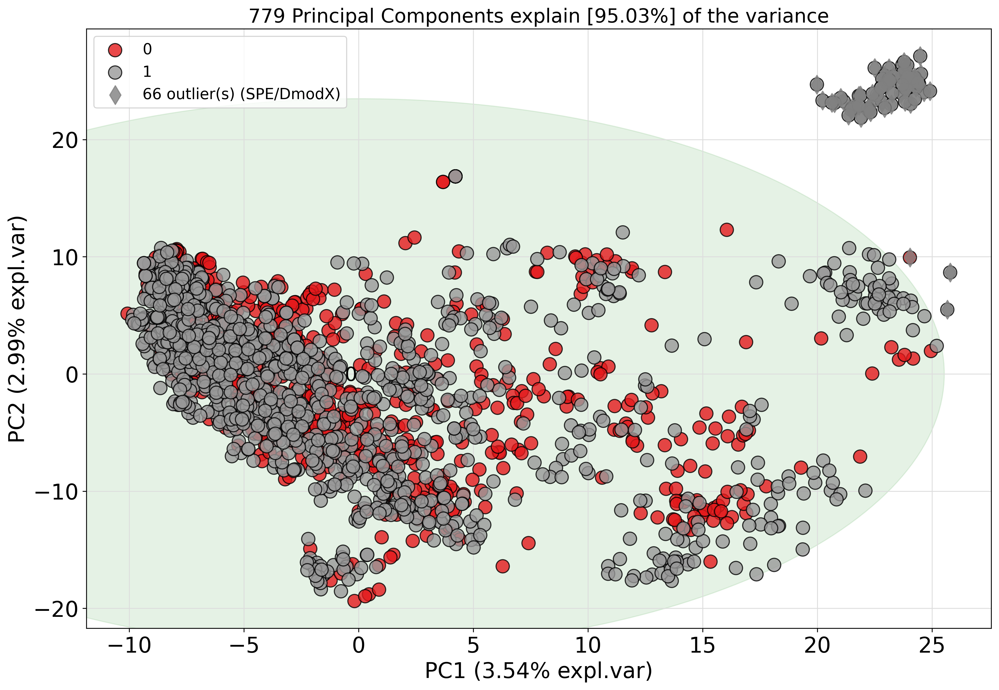

In [8]:
# 2D scatter plot
model.scatter(labels=y, SPE=True, legend=True, cmap='Set1', figsize=(15,10), dpi=300)

[scatterd] >INFO> Create scatterplot


(<Figure size 9000x6000 with 1 Axes>,
 <Axes3D: title={'center': '779 Principal Components explain [95.03%] of the variance'}, xlabel='PC1 (3.54% expl.var)', ylabel='PC2 (2.99% expl.var)', zlabel='PC3 (1.95% expl.var)'>)

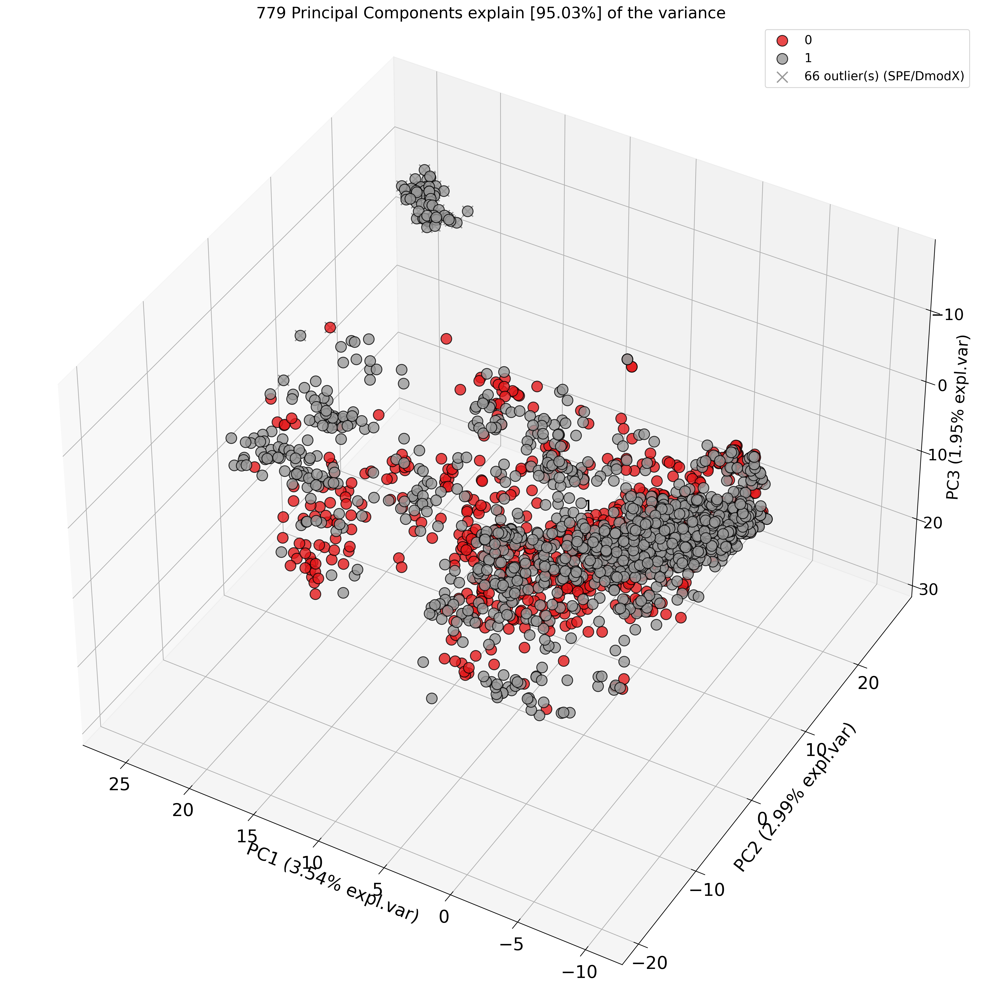

In [9]:
# 3D plot
model.scatter3d(labels=y, SPE=True, legend=True, cmap='Set1', figsize=(30,20), dpi=300)

**Preprocessing**

In [10]:
# Print outliers
pd.set_option('display.max_rows', model.results['outliers'].shape[0]+1)
spe = model.results['outliers']
outlier = spe.loc[spe['y_bool_spe']==True]
outlier

<IPython.core.display.Javascript object>

,y_proba,p_raw,y_score,y_bool,y_bool_spe,y_score_spe
178,3.870386e-284,5.119558e-285,4515.218342,True,True,36.533601
764,0.000000e+00,0.000000e+00,5856.157310,True,True,27.202481
1220,0.000000e+00,0.000000e+00,4885.715214,True,True,33.843254
1221,0.000000e+00,0.000000e+00,4988.109392,True,True,33.670332
1222,0.000000e+00,0.000000e+00,5085.132996,True,True,34.433251
1223,0.000000e+00,0.000000e+00,5024.237486,True,True,34.256350
1224,0.000000e+00,0.000000e+00,5062.717375,True,True,34.461819
1225,0.000000e+00,0.000000e+00,4718.752607,True,True,34.459271
1226,0.000000e+00,0.000000e+00,4962.019613,True,True,34.517526
1227,0.000000e+00,0.000000e+00,5094.310937,True,True,34.977596


In [11]:
# Print values to remove
remove = outlier.index.values
remove

array([ 178,  764, 1220, 1221, 1222, 1223, 1224, 1225, 1226, 1227, 1228,
       1229, 1230, 1231, 1232, 1233, 1234, 1235, 1236, 1237, 1238, 1239,
       1240, 1241, 1242, 1243, 1244, 1245, 1246, 1247, 1248, 1249, 1250,
       1251, 1252, 1253, 1254, 1255, 1256, 1257, 1258, 1259, 1260, 1261,
       1262, 1263, 1264, 1265, 1266, 1267, 1268, 1269, 1270, 1271, 1272,
       1273, 1274, 1275, 1276, 1277, 1278, 1279, 1280, 1281, 1298, 1688])

In [12]:
data1 = data.drop(data.index[[ 178,  764, 1220, 1221, 1222, 1223, 1224, 1225, 1226, 1227, 1228,
       1229, 1230, 1231, 1232, 1233, 1234, 1235, 1236, 1237, 1238, 1239,
       1240, 1241, 1242, 1243, 1244, 1245, 1246, 1247, 1248, 1249, 1250,
       1251, 1252, 1253, 1254, 1255, 1256, 1257, 1258, 1259, 1260, 1261,
       1262, 1263, 1264, 1265, 1266, 1267, 1268, 1269, 1270, 1271, 1272,
       1273, 1274, 1275, 1276, 1277, 1278, 1279, 1280, 1281, 1298, 1688]])

X1 = data1.loc[:, ~data1.columns.isin(['id', 'smiles', 'Ecoli'])]
y1 = data1.iloc[:, 2].values
print(X1.shape)
X1.head()

(2202, 2048)


,ECFP0,ECFP1,ECFP2,ECFP3,ECFP4,ECFP5,ECFP6,ECFP7,ECFP8,ECFP9,...,ECFP2038,ECFP2039,ECFP2040,ECFP2041,ECFP2042,ECFP2043,ECFP2044,ECFP2045,ECFP2046,ECFP2047
0,0,1,0,0,0,1,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
1,0,1,0,0,0,0,0,0,0,0,...,0,0,0,1,1,0,0,0,0,0
2,0,1,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,1,1,0,0
3,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0


In [13]:
# Split dataset into train & test sets
X_train, X_test, y_train, y_test = train_test_split(X1, y1, test_size=0.20, stratify=y1,
                                                   random_state=42)

print("Size of training set: {}   size of test set:"
      " {}\n".format(X_train.shape[0], X_test.shape[0]))

<IPython.core.display.Javascript object>

Size of training set: 1761   size of test set: 441



**Logit**

In [14]:
# Perform random search to optimize parameters for logit
logit = LogisticRegression(max_iter=5000, class_weight='balanced', random_state=42)
param = {'C': np.logspace(-3,3,30)}
logit_cv = RandomizedSearchCV(logit, param, cv=10, n_jobs=-1, random_state=42)
logit_cv.fit(X_train, y_train)

print('best paremeters: ', logit_cv.best_params_)
print('best score after random search cv:', logit_cv.best_score_)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

best paremeters:  {'C': 0.0727895384398315}
best score after random search cv: 0.7921578068823832


In [15]:
# Zoom on specific values
logit = LogisticRegression(max_iter=5000, class_weight='balanced', random_state=42)
param = {'C': np.linspace(4.5203e-2,1.1721e-1,30)}
logit_cv = RandomizedSearchCV(logit, param, cv=10, n_jobs=-1, random_state=42)
logit_cv.fit(X_train, y_train)

print('best paremeters: ', logit_cv.best_params_)
print('best score after random search cv:', logit_cv.best_score_)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

best paremeters:  {'C': 0.104795}
best score after random search cv: 0.7967000513610684


In [16]:
# Train logit
logit_tuned = LogisticRegression(max_iter=5000, class_weight='balanced',
                                 C=0.10480, n_jobs=-1, random_state=42)
logit_tuned.fit(X_train, y_train)

# Print intercept & coefficients
print('intercept:', logit_tuned.intercept_)
print('coef:', logit_tuned.coef_, end='\n')

<IPython.core.display.Javascript object>

intercept: [-2.45921578]
coef: [[ 0.07675418 -0.02980029  0.12261091 ...  0.03202784  0.24237511
   0.04485367]]


In [19]:
# Evaluate the logit model on training set
print("Performance of evaluation metrics on training set")
y_train_pred = cross_val_predict(logit_tuned, X_train, y_train, cv=10, n_jobs=-1)
print("MCC score for logit: {:.4f}".format(matthews_corrcoef(y_train, y_train_pred)))
print("ROC-AUC for logit: {:.4f}".format(roc_auc_score(y_train, y_train_pred)))
print("accuracy score for logit: {:.4f}".format(accuracy_score(y_train, y_train_pred)))
print("kappa score for logit: {:.4f}".format(cohen_kappa_score(y_train, y_train_pred)))
print("f1 score for logit: {:.4f}".format(f1_score(y_train, y_train_pred)))

Performance of evaluation metrics on training set
MCC score for logit: 0.5805
ROC-AUC for logit: 0.7899
accuracy score for logit: 0.7967
kappa score for logit: 0.5805
f1 score for logit: 0.8271


**KNN**

In [16]:
# Perform random search to optimize parameters for KNN
knn = KNeighborsClassifier()
param = {'n_neighbors': range(3,20), 'weights': ['uniform', 'distance'],
         'leaf_size': range(10,50), 'p': [1,2,3]}
knn_cv = RandomizedSearchCV(knn, param, cv=10, n_jobs=-1, random_state=42)
knn_cv.fit(X_train, y_train)

print('best paremeters: ', knn_cv.best_params_)
print('best score after random search cv:', knn_cv.best_score_)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

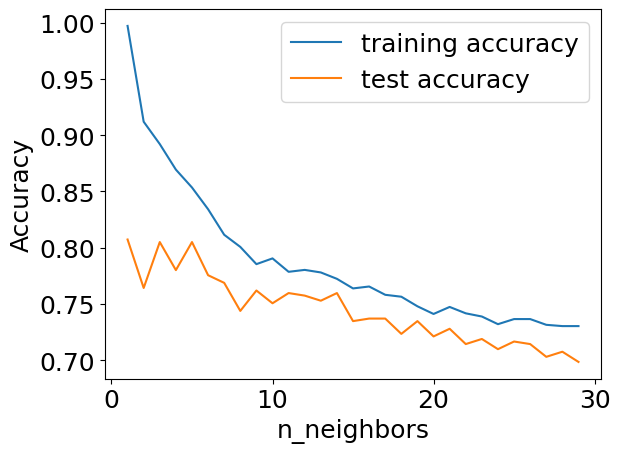

In [17]:
# Find the optimum k
train_acc = []
test_acc = []
# try n_neighbors from 1 to 30
neighbors_settings = range(1, 30)

for n_neighbors in neighbors_settings:
    # build the model
    knn = KNeighborsClassifier(n_neighbors=n_neighbors)
    knn.fit(X_train, y_train)
    # record training set accuracy
    train_acc.append(knn.score(X_train, y_train))
    # record generalization accuracy
    test_acc.append(knn.score(X_test, y_test))

plt.plot(neighbors_settings, train_acc, label="training accuracy")
plt.plot(neighbors_settings, test_acc, label="test accuracy")
plt.ylabel("Accuracy")
plt.xlabel("n_neighbors")
plt.legend()

In [18]:
# Train KNN
knn_tuned = KNeighborsClassifier(n_neighbors=7, weights='distance', leaf_size=31,
                                 p=2, n_jobs=-1)
knn_tuned.fit(X_train, y_train)

KNeighborsClassifier(leaf_size=31, n_jobs=-1, n_neighbors=7, weights='distance')

In [20]:
# Evaluate the KNN model on training set
print("Performance of evaluation metrics on training set")
y_train_pred = cross_val_predict(knn_tuned, X_train, y_train, cv=10, n_jobs=-1)
print("MCC score for KNN: {:.4f}".format(matthews_corrcoef(y_train, y_train_pred)))
print("ROC-AUC for KNN: {:.4f}".format(roc_auc_score(y_train, y_train_pred)))
print("accuracy score for KNN: {:.4f}".format(accuracy_score(y_train, y_train_pred)))
print("kappa score for KNN: {:.4f}".format(cohen_kappa_score(y_train, y_train_pred)))
print("f1 score for KNN: {:.4f}".format(f1_score(y_train, y_train_pred)))

Performance of evaluation metrics on training set
MCC score for KNN: 0.5068
ROC-AUC for KNN: 0.7467
accuracy score for KNN: 0.7638
kappa score for KNN: 0.5033
f1 score for KNN: 0.8076


**SVC**

In [21]:
# Perform random search to optimize parameters for SVC
svc = SVC(class_weight='balanced', random_state=42)
param = {'C': np.linspace(0.01,10,20), 'kernel': ['rbf'], 'gamma': np.logspace(-6,1,20)}
svc_cv = RandomizedSearchCV(svc, param, cv=10, n_jobs=-1, random_state=42)
svc_cv.fit(X_train, y_train)

print('best paremeters: ', svc_cv.best_params_)
print('best score after random search cv:', svc_cv.best_score_)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

best paremeters:  {'kernel': 'rbf', 'gamma': 0.004832930238571752, 'C': 5.267894736842106}
best score after random search cv: 0.8205476373908578


In [22]:
# Zoom on specific values
svc = SVC(class_weight='balanced', random_state=42)
param = {'C': np.linspace(4.7421,5.7937,20), 'kernel': ['rbf'], 'gamma': np.linspace(2.0691e-3,1.1288e-2,20)}
svc_cv = RandomizedSearchCV(svc, param, cv=10, n_jobs=-1, random_state=42)
svc_cv.fit(X_train, y_train)

print('best paremeters: ', svc_cv.best_params_)
print('best score after random search cv:', svc_cv.best_score_)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

best paremeters:  {'kernel': 'rbf', 'gamma': 0.0049803315789473685, 'C': 5.074184210526315}
best score after random search cv: 0.8216872110939908


In [23]:
# Train SVC
svc_tuned = SVC(C=5.0742, kernel='rbf', gamma=4.9803e-3, class_weight='balanced',
                probability=True, random_state=42)
svc_tuned.fit(X_train, y_train)

SVC(C=5.0742, class_weight='balanced', gamma=0.0049803, probability=True,
    random_state=42)

In [24]:
# Evaluate the SVC model on training set
print("Performance of evaluation metrics on training set")
y_train_pred = cross_val_predict(svc_tuned, X_train, y_train, cv=10, n_jobs=-1)
print("MCC score for SVC: {:.4f}".format(matthews_corrcoef(y_train, y_train_pred)))
print("ROC-AUC for SVC: {:.4f}".format(roc_auc_score(y_train, y_train_pred)))
print("accuracy score for SVC: {:.4f}".format(accuracy_score(y_train, y_train_pred)))
print("kappa score for SVC: {:.4f}".format(cohen_kappa_score(y_train, y_train_pred)))
print("f1 score for SVC: {:.4f}".format(f1_score(y_train, y_train_pred)))

Performance of evaluation metrics on training set
MCC score for SVC: 0.6298
ROC-AUC for SVC: 0.8108
accuracy score for SVC: 0.8217
kappa score for SVC: 0.6285
f1 score for SVC: 0.8517


**RF**

In [25]:
# Perform random search to optimize parameters for RF
forest = RandomForestClassifier(class_weight='balanced', random_state=42)
param = {'n_estimators': np.linspace(100,1200,20).astype(int),
         'criterion': ['gini', 'entropy'],
         'max_depth': np.linspace(5,40,20).astype(int),
         'max_features':['sqrt', 'log2', None]}
forest_cv = RandomizedSearchCV(forest, param, n_jobs=-1, cv=10, random_state=42)
forest_cv.fit(X_train, y_train)

print('best paremeters: ', forest_cv.best_params_)
print('best score after random search cv:', forest_cv.best_score_)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

best paremeters:  {'n_estimators': 621, 'max_features': 'sqrt', 'max_depth': 34, 'criterion': 'entropy'}
best score after random search cv: 0.809180790960452


In [26]:
# Zoom on specific values
forest = RandomForestClassifier(class_weight='balanced', random_state=42)
param = {'n_estimators': range(563,679),
         'criterion': ['entropy'],
         'max_depth': range(30,40),
         'max_features':['sqrt']}
forest_cv = RandomizedSearchCV(forest, param, n_jobs=-1, cv=10, random_state=42)
forest_cv.fit(X_train, y_train)

print('best paremeters: ', forest_cv.best_params_)
print('best score after random search cv:', forest_cv.best_score_)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

best paremeters:  {'n_estimators': 661, 'max_features': 'sqrt', 'max_depth': 32, 'criterion': 'entropy'}
best score after random search cv: 0.8086126091422703


In [30]:
# Train RF
forest_tuned = RandomForestClassifier(n_estimators=661, criterion='entropy', max_depth=32,
                                      max_features='sqrt', class_weight='balanced',
                                      n_jobs=-1, random_state=42)
forest_tuned.fit(X_train, y_train)

<IPython.core.display.Javascript object>

RandomForestClassifier(class_weight='balanced', criterion='entropy',
                       max_depth=32, n_estimators=661, n_jobs=-1,
                       random_state=42)

In [31]:
# Evaluate the RF model on training set
print("Performance of evaluation metrics on training set")
y_train_pred = cross_val_predict(forest_tuned, X_train, y_train, cv=10, n_jobs=-1)
print("MCC score for RF: {:.4f}".format(matthews_corrcoef(y_train, y_train_pred)))
print("ROC-AUC for RF: {:.4f}".format(roc_auc_score(y_train, y_train_pred)))
print("accuracy score for RF: {:.4f}".format(accuracy_score(y_train, y_train_pred)))
print("kappa score for RF: {:.4f}".format(cohen_kappa_score(y_train, y_train_pred)))
print("f1 score for RF: {:.4f}".format(f1_score(y_train, y_train_pred)))

Performance of evaluation metrics on training set
MCC score for RF: 0.6024
ROC-AUC for RF: 0.7896
accuracy score for RF: 0.8086
kappa score for RF: 0.5949
f1 score for RF: 0.8465


**XGB**

In [32]:
# Perform random search to optimize parameters for XGB
xgb = XGBClassifier(tree_method='gpu_hist', gpu_id=0, objective='binary:logistic',
                    scale_pos_weight=1, random_state=42)
param = {'learning_rate': np.logspace(-3,0,20),
         'n_estimators': np.linspace(100,1200,20).astype(int),
         'gamma': np.logspace(-6,1,20),
         'max_depth': np.linspace(5,30,20).astype(int),
         'subsample': np.linspace(0,1,20),
         'colsample_bytree': np.linspace(0,1,20),
         'alpha': np.logspace(-3,3,20)}
xgb_cv = RandomizedSearchCV(xgb, param, cv=10, random_state=42)
xgb_cv.fit(X_train, y_train)

print('best paremeters: ', xgb_cv.best_params_)
print('best score after random search cv:', xgb_cv.best_score_)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

best paremeters:  {'subsample': 0.7368421052631579, 'n_estimators': 678, 'max_depth': 20, 'learning_rate': 0.11288378916846883, 'gamma': 1.274274985703132e-05, 'colsample_bytree': 0.7368421052631579, 'alpha': 0.07847599703514611}
best score after random search cv: 0.8148593990755006


In [33]:
# Zoom on specific values
xgb = XGBClassifier(tree_method='gpu_hist', gpu_id=0, objective='binary:logistic',
                    scale_pos_weight=1, random_state=42)
param = {'learning_rate': np.linspace(7.8476e-2,1.6238e-1,20),
         'n_estimators': range(621,737),
         'gamma': np.linspace(5.4556e-6,2.9764e-5,20),
         'max_depth': range(15,25),
         'subsample': np.linspace(0.68421,0.78947,20),
         'colsample_bytree': np.linspace(0.68421,0.78947,20),
         'alpha': np.linspace(3.7927e-2,1.6234e-1,20)}
xgb_cv = RandomizedSearchCV(xgb, param, cv=10, random_state=42)
xgb_cv.fit(X_train, y_train)

print('best paremeters: ', xgb_cv.best_params_)
print('best score after random search cv:', xgb_cv.best_score_)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

best paremeters:  {'subsample': 0.69529, 'n_estimators': 650, 'max_depth': 23, 'learning_rate': 0.15354800000000002, 'gamma': 1.3131936842105263e-05, 'colsample_bytree': 0.75623, 'alpha': 0.09031142105263158}
best score after random search cv: 0.8205315870570107


In [34]:
# Train XGB
xgb_tuned = XGBClassifier(tree_method='gpu_hist', gpu_id=0, objective='binary:logistic',
                          scale_pos_weight=1, learning_rate=0.15355, n_estimators=650,
                          gamma=1.3132e-5, max_depth=23, subsample=0.69529,
                          colsample_bytree=0.75623, alpha=0.090311, random_state=42)
xgb_tuned.fit(X_train, y_train)

XGBClassifier(alpha=0.090311, base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.75623, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=1.3132e-05, gpu_id=0, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.15355, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=23,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, n_estimators=650, n_jobs=None,
              num_parallel_tree=None, predictor=None, ...)

In [35]:
# Evaluate the XGB model on training set
print("Performance of evaluation metrics on training set")
y_train_pred = cross_val_predict(xgb_tuned, X_train, y_train, cv=10)
print("MCC score for XGB: {:.4f}".format(matthews_corrcoef(y_train, y_train_pred)))
print("ROC-AUC for XGB: {:.4f}".format(roc_auc_score(y_train, y_train_pred)))
print("accuracy score for XGB: {:.4f}".format(accuracy_score(y_train, y_train_pred)))
print("kappa score for XGB: {:.4f}".format(cohen_kappa_score(y_train, y_train_pred)))
print("f1 score for XGB: {:.4f}".format(f1_score(y_train, y_train_pred)))

Performance of evaluation metrics on training set
MCC score for XGB: 0.6246
ROC-AUC for XGB: 0.8065
accuracy score for XGB: 0.8194
kappa score for XGB: 0.6222
f1 score for XGB: 0.8513


**LGBM**

In [38]:
# Perform random search to optimize parameters for LGBM
lgbm = LGBMClassifier(device='cpu', objective='binary', is_unbalance=True, bagging_freq=1,
                     random_state=42)
param = {'n_estimators': np.linspace(100,1200,20).astype(int),
         'learning_rate': np.logspace(-3,0,20),
         'num_leaves': np.linspace(10,300,20).astype(int),
         'max_depth': range(5,30),
         'min_data_in_leaf': np.linspace(20,300,20).astype(int),
         'bagging_fraction': np.linspace(0.5,0.9,5),
         'feature_fraction': np.linspace(0.5,0.9,5)}
lgbm_cv = RandomizedSearchCV(lgbm, param, cv=10, random_state=42)
lgbm_cv.fit(X_train, y_train)

print('best paremeters: ', lgbm_cv.best_params_)
print('best score after random search cv:', lgbm_cv.best_score_)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

In [39]:
# Zoom on specific values
lgbm = LGBMClassifier(device='cpu', objective='binary', is_unbalance=True, bagging_freq=1,
                     random_state=42)
param = {'n_estimators': range(853,968),
         'learning_rate': np.linspace(0.16238,0.33598,20),
         'num_leaves': range(178,208),
         'max_depth': range(10,20),
         'min_data_in_leaf': range(79,108),
         'bagging_fraction': np.linspace(0.5,0.9,5),
         'feature_fraction': np.linspace(0.5,0.9,5)}
lgbm_cv = RandomizedSearchCV(lgbm, param, cv=10, random_state=42)
lgbm_cv.fit(X_train, y_train)

print('best paremeters: ', lgbm_cv.best_params_)
print('best score after random search cv:', lgbm_cv.best_score_)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

In [40]:
# Train LGBM
lgbm_tuned = LGBMClassifier(device='cpu', objective='binary', is_unbalance=True,
                            n_estimators=910, learning_rate=0.23357, num_leaves=193,
                            max_depth=16, min_data_in_leaf=93, bagging_fraction=0.9,
                            bagging_freq=1, feature_fraction=0.7, random_state=42)
lgbm_tuned.fit(X_train, y_train)

[LightGBM] [Warning] min_data_in_leaf is set=93, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=93
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=93, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=93
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Info] Number of positive: 1032, number of nega

LGBMClassifier(bagging_fraction=0.9, bagging_freq=1, device='cpu',
               feature_fraction=0.7, is_unbalance=True, learning_rate=0.23357,
               max_depth=16, min_data_in_leaf=93, n_estimators=910,
               num_leaves=193, objective='binary', random_state=42)

In [41]:
# Evaluate the LGBM model on training set
print("Performance of evaluation metrics on training set")
y_train_pred = cross_val_predict(lgbm_tuned, X_train, y_train, cv=10)
print("MCC score for LGBM: {:.4f}".format(matthews_corrcoef(y_train, y_train_pred)))
print("ROC-AUC for LGBM: {:.4f}".format(roc_auc_score(y_train, y_train_pred)))
print("accuracy score for LGBM: {:.4f}".format(accuracy_score(y_train, y_train_pred)))
print("kappa score for LGBM: {:.4f}".format(cohen_kappa_score(y_train, y_train_pred)))
print("f1 score for LGBM: {:.4f}".format(f1_score(y_train, y_train_pred)))

Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

**Voting**

In [42]:
# Train voting model
vote = VotingClassifier(estimators=[('svc', svc_tuned), ('xgb', xgb_tuned),
                                     ('lgbm', lgbm_tuned)], voting='soft')

vote.fit(X_train, y_train)

[LightGBM] [Warning] min_data_in_leaf is set=93, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=93
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=93, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=93
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Info] Number of positive: 1032, number of nega

VotingClassifier(estimators=[('svc',
                              SVC(C=5.0742, class_weight='balanced',
                                  gamma=0.0049803, probability=True,
                                  random_state=42)),
                             ('xgb',
                              XGBClassifier(alpha=0.090311, base_score=None,
                                            booster=None, callbacks=None,
                                            colsample_bylevel=None,
                                            colsample_bynode=None,
                                            colsample_bytree=0.75623,
                                            early_stopping_rounds=None,
                                            enable_categorical=False,
                                            eval_metric=None,
                                            feature...
                                            min_child_weight=None, missing=nan,
                                            monotone_constraints=None,
                                            n_estimators=650, n_jobs=None,
                                            num_parallel_tree=None,
                                            predictor=None, ...)),
                             ('lgbm',
                              LGBMClassifier(bagging_fraction=0.9,
                                             bagging_freq=1, device='cpu',
                                             feature_fraction=0.7,
                                             is_unbalance=True,
                                             learning_rate=0.23357,
                                             max_depth=16, min_data_in_leaf=93,
                                             n_estimators=910, num_leaves=193,
                                             objective='binary',
                                             random_state=42))],
                 voting='soft')

In [43]:
# Evaluate the voting model on training set
print("Performance of evaluation metrics on training set")
y_train_pred = cross_val_predict(vote, X_train, y_train, cv=10)
print("MCC score for voting: {:.4f}".format(matthews_corrcoef(y_train, y_train_pred)))
print("ROC-AUC for voting: {:.4f}".format(roc_auc_score(y_train, y_train_pred)))
print("accuracy score for voting: {:.4f}".format(accuracy_score(y_train, y_train_pred)))
print("kappa score for voting: {:.4f}".format(cohen_kappa_score(y_train, y_train_pred)))
print("f1 score for voting: {:.4f}".format(f1_score(y_train, y_train_pred)))

Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

**Stacking**

In [44]:
# Train stacking model
stack = StackingClassifier(estimators=[('svc', svc_tuned), ('xgb', xgb_tuned),
                                         ('lgbm', lgbm_tuned)])

stack.fit(X_train, y_train)

Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

StackingClassifier(estimators=[('svc',
                                SVC(C=5.0742, class_weight='balanced',
                                    gamma=0.0049803, probability=True,
                                    random_state=42)),
                               ('xgb',
                                XGBClassifier(alpha=0.090311, base_score=None,
                                              booster=None, callbacks=None,
                                              colsample_bylevel=None,
                                              colsample_bynode=None,
                                              colsample_bytree=0.75623,
                                              early_stopping_rounds=None,
                                              enable_categorical=False,
                                              eval_metric=None,
                                              featu...
                                              min_child_weight=None,
                                              missing=nan,
                                              monotone_constraints=None,
                                              n_estimators=650, n_jobs=None,
                                              num_parallel_tree=None,
                                              predictor=None, ...)),
                               ('lgbm',
                                LGBMClassifier(bagging_fraction=0.9,
                                               bagging_freq=1, device='cpu',
                                               feature_fraction=0.7,
                                               is_unbalance=True,
                                               learning_rate=0.23357,
                                               max_depth=16,
                                               min_data_in_leaf=93,
                                               n_estimators=910, num_leaves=193,
                                               objective='binary',
                                               random_state=42))])

In [45]:
# Evaluate the stacking model on training set
print("Performance of evaluation metrics on training set")
y_train_pred = cross_val_predict(stack, X_train, y_train, cv=10)
print("MCC score for stacking: {:.4f}".format(matthews_corrcoef(y_train, y_train_pred)))
print("ROC-AUC for stacking: {:.4f}".format(roc_auc_score(y_train, y_train_pred)))
print("accuracy score for stacking: {:.4f}".format(accuracy_score(y_train, y_train_pred)))
print("kappa score for stacking: {:.4f}".format(cohen_kappa_score(y_train, y_train_pred)))
print("f1 score for stacking: {:.4f}".format(f1_score(y_train, y_train_pred)))

Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

**PR curves**

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

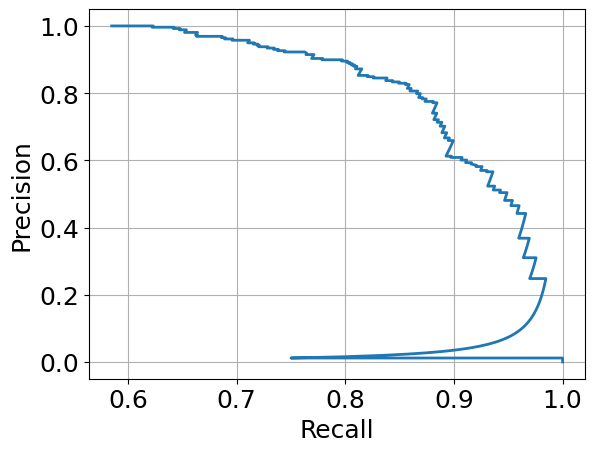

In [46]:
# Plot PR curve for logit model
y_thres = logit_tuned.decision_function(X_test)
precision, recall, thresholds = precision_recall_curve(y_test, y_thres)
def plot_PR_curve(precision, recall, label=None):
    plt.plot(precision, recall, linewidth=2, label=label)
    plt.ylabel('Precision')
    plt.xlabel('Recall')
    plt.grid()
plot_PR_curve(precision, recall)

[LightGBM] [Warning] min_data_in_leaf is set=93, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=93
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=93, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=93
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=93, min_child

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

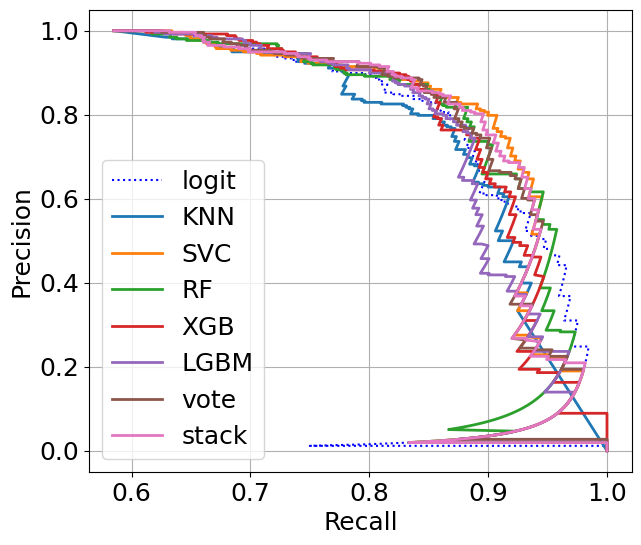

In [47]:
# Compare ROC curve for all models
y_proba_knn = knn_tuned.predict_proba(X_test)[:, 1]
y_thres_svc = svc_tuned.decision_function(X_test)
y_proba_forest = forest_tuned.predict_proba(X_test)[:, 1]
y_proba_xgb = xgb_tuned.predict_proba(X_test)[:, 1]
y_proba_lgbm = lgbm_tuned.predict_proba(X_test)[:, 1]
y_proba_vote = vote.predict_proba(X_test)[:, 1]
y_proba_stack = stack.predict_proba(X_test)[:, 1]

precision_knn, recall_knn, thresholds_knn = precision_recall_curve(y_test, y_proba_knn)
precision_svc, recall_svc, thresholds_svc = precision_recall_curve(y_test, y_thres_svc)
precision_forest, recall_forest, thresholds_forest = precision_recall_curve(y_test, y_proba_forest)
precision_xgb, recall_xgb, thresholds_xgb = precision_recall_curve(y_test, y_proba_xgb)
precision_lgbm, recall_lgbm, thresholds_lgbm = precision_recall_curve(y_test, y_proba_lgbm)
precision_vote, recall_vote, thresholds_vote = precision_recall_curve(y_test, y_proba_vote)
precision_stack, recall_stack, thresholds_stack = precision_recall_curve(y_test, y_proba_stack)

plt.figure(figsize=(7, 6))
plt.plot(precision, recall, "b:", label="logit")
plot_PR_curve(precision_knn, recall_knn, "KNN")
plot_PR_curve(precision_svc, recall_svc, "SVC")
plot_PR_curve(precision_forest, recall_forest, "RF")
plot_PR_curve(precision_xgb, recall_xgb, "XGB")
plot_PR_curve(precision_lgbm, recall_lgbm, "LGBM")
plot_PR_curve(precision_vote, recall_vote, "vote")
plot_PR_curve(precision_stack, recall_stack, "stack")

plt.legend(loc="best")

ROC curves

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

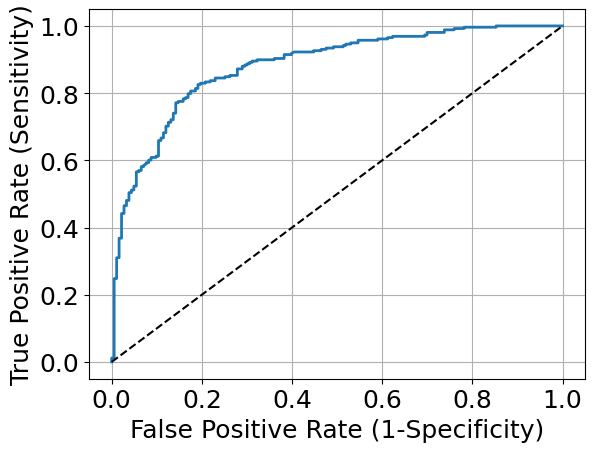

In [48]:
# Plot ROC curve for logit model
fpr, tpr, thresholds = roc_curve(y_test, y_thres)
def plot_roc_curve(fpr, tpr, label=None):
    plt.plot(fpr, tpr, linewidth=2, label=label)
    plt.plot([0, 1], [0, 1], 'k--') # Dashed diagonal
    plt.ylabel('True Positive Rate (Sensitivity)')
    plt.xlabel('False Positive Rate (1-Specificity)')
    plt.grid()
plot_roc_curve(fpr, tpr)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

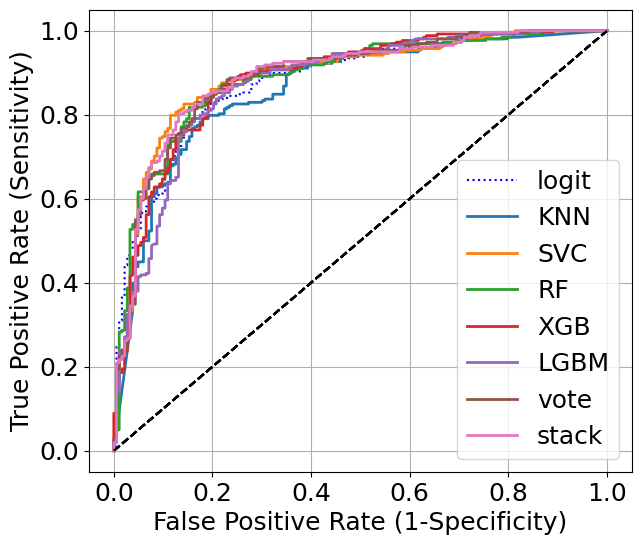

In [49]:
# Compare ROC curve for all models
fpr_knn, tpr_knn, thresholds_knn = roc_curve(y_test, y_proba_knn)
fpr_svc, tpr_svc, thresholds_svc = roc_curve(y_test, y_thres_svc)
fpr_forest, tpr_forest, thresholds_forest = roc_curve(y_test, y_proba_forest)
fpr_xgb, tpr_xgb, thresholds_xgb = roc_curve(y_test, y_proba_xgb)
fpr_lgbm, tpr_lgbm, thresholds_lgbm = roc_curve(y_test, y_proba_lgbm)
fpr_vote, tpr_vote, thresholds_vote = roc_curve(y_test, y_proba_vote)
fpr_stack, tpr_stack, thresholds_stack = roc_curve(y_test, y_proba_stack)

plt.figure(figsize=(7, 6))
plt.plot(fpr, tpr, "b:", label="logit")
plot_roc_curve(fpr_knn, tpr_knn, "KNN")
plot_roc_curve(fpr_svc, tpr_svc, "SVC")
plot_roc_curve(fpr_forest, tpr_forest, "RF")
plot_roc_curve(fpr_xgb, tpr_xgb, "XGB")
plot_roc_curve(fpr_lgbm, tpr_lgbm, "LGBM")
plot_roc_curve(fpr_vote, tpr_vote, "vote")
plot_roc_curve(fpr_stack, tpr_stack, "stack")

plt.legend(loc="lower right")

In [50]:
# Evaluate the voting model on test set
y_pred_vote = vote.predict(X_test)
y_proba_vote = vote.predict_proba(X_test)[:, 1]
print("Performance of evaluation metrics on test set")
print("accuracy score for SVC: {:.4f}".format(accuracy_score(y_test, y_pred_vote)))
print("kappa score for SVC: {:.4f}".format(cohen_kappa_score(y_test, y_pred_vote)))
print("precision score for SVC: {:.4f}".format(precision_score(y_test, y_pred_vote)))
print("sensitivity score for SVC: {:.4f}".format(recall_score(y_test, y_pred_vote)))
print("ROC-AUC for SVC: {:.4f}".format(roc_auc_score(y_test, y_proba_vote)))
print("f1 score for SVC: {:.4f}".format(f1_score(y_test, y_pred_vote)))
print("MCC score for SVC: {:.4f}".format(matthews_corrcoef(y_test, y_pred_vote)))

[LightGBM] [Warning] min_data_in_leaf is set=93, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=93
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=93, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=93
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
Performance of evaluation metrics on test set
accuracy sco

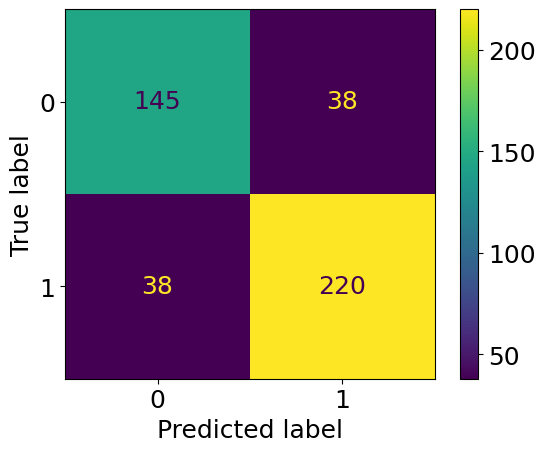

In [51]:
# Plot confusion matrix for voting model
cm = confusion_matrix(y_test, y_pred_vote, labels=vote.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=vote.classes_)
disp.plot()

In [52]:
# Output observations that were incorrectly labeled
Flabel = pd.DataFrame(X_test[y_test != y_pred_vote])
Flabel

<IPython.core.display.Javascript object>

,ECFP0,ECFP1,ECFP2,ECFP3,ECFP4,ECFP5,ECFP6,ECFP7,ECFP8,ECFP9,...,ECFP2038,ECFP2039,ECFP2040,ECFP2041,ECFP2042,ECFP2043,ECFP2044,ECFP2045,ECFP2046,ECFP2047
1738,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,1,0
1949,0,1,0,0,1,0,0,0,1,0,...,0,0,0,0,1,0,0,0,0,1
558,0,1,0,0,0,1,0,1,0,0,...,0,1,0,0,0,0,0,0,0,0
43,0,1,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
551,0,1,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
1092,0,1,0,0,0,0,0,0,0,0,...,0,0,0,1,1,0,0,0,0,0
681,0,1,0,0,0,0,0,0,0,0,...,1,0,0,0,1,0,0,0,0,0
1135,0,1,0,0,0,0,0,0,0,0,...,0,0,0,1,1,0,0,0,0,0
1727,0,1,0,0,0,0,0,0,0,0,...,0,0,0,1,1,0,0,0,0,0
1420,0,1,0,0,0,0,0,0,0,0,...,0,0,0,1,1,0,0,0,1,0
